# Filtros digitais

Neste notebook faremos uma introdução aos filtros digitais. No capítulo anterior investigamos os filtros analógicos com a Transformada de Laplace. Tais filtros são compostos de elementos eletrônicos como resistores, indutores, capacitores e amplificadores operacionais. Em contraste, os filtros digitais são, em essência, um pequeno programa de computador, executado no seu computador pessoal ou em algum hardware dedicado (p. ex. um micro-processador ou uma mesa de som digital). Essencialmente, o que o filtro digital faz é tomar como entrada um sinal digital e computar a saída com base neste sinal e nos coeficientes do filtro. 

Temos dois tipos principais de filtros digitais:

- Filtros IIR (Infinite Impulse Response)
- Filtros FIR (Finite Impulse Response)

# Filtros IIR

Neste notebook vamos explorar o projeto de Filtros IIR (Infinite Impulse Response). Esta é uma propriedade que muitos SLIT's possuem, sendo que a resposta ao impulso, $h(t)$, decai à medida que passa o tempo, mas nunca se torna exatamente zero. Filtros eletrônicos compostos por resistores, indutores, capacitores possuem esta propriedade. 

A Transformada Z geral de um filtro IIR é dada por:

\begin{equation}
H(z) = \frac{\sum\limits_{i=0}^{P}b_i z^{-i}}{1+\sum\limits_{i=1}^{Q}a_i z^{-i}}
\tag{1}
\end{equation}

Podemos pensar na relação entre os sinais de entrada e saída. Tenha em mente que você pode usar o filtro para processar um sinal em tempo real. Assim, a Eq. (1) se torna


\begin{equation}
\frac{Y(z)}{X(z)} = \frac{\sum\limits_{i=0}^{P}b_i z^{-i}}{1+\sum\limits_{i=1}^{Q}a_i z^{-i}}
\end{equation}

\begin{equation}
Y(z) + a_1 z^{-1} Y(z) + a_2 z^{-2} Y(z) + ... + a_Q z^{-Q} Y(z) = b_0 X(z) + b_1 z^{-1} X(z) + b_2 z^{-2} X(z) + ... + b_P z^{-P} X(z)
\tag{2}
\end{equation}

e se lembrarmos que a TZ de $\delta[n-m]$ é $z^{-m}$, a TZ inversa da Eq. (2) é
    
\begin{equation}
y[n] + a_1 y[n-1] + a_2 y[n-2] + ... + a_Q y[n-Q] = b_0 x[n] + b_1 x[n-1] + b_2 x[n-2] + ... + b_P x[n-P]
\end{equation}    

o que implica que o estado atual da saída, $y[n]$, é computado com base no estado atual e passado do sinal de entrada e em instantes passados do sinal de saída.

\begin{equation}
y[n] = b_0 x[n] + b_1 x[n-1] + b_2 x[n-2] + ... + b_P x[n-P] - a_1 y[n-1] - a_2 y[n-2] - ... - a_Q y[n-Q]
\tag{3}
\end{equation} 

Nós podemos ver a Eq. (3) como operações vetoriais:

- $\textbf{x}_n = \left\{x[n] \ x[n-1] \ x[n-2] \ ... \ x[n-P] \right\}$
- $\textbf{b} = \left\{b_0 \ b_1 \ b_2 \ ... \ b_P \right\}$
- $\textbf{y}_n = \left\{y[n-1] \ y[n-2] \ ... \ y[n-Q] \right\}$
- $\textbf{a} = \left\{a_1 \ a_2 \ ... \ a_Q \right\}$

\begin{equation}
y[n] = \textbf{b} \ \textbf{x}_{n}^{T} - \textbf{a} \ \textbf{y}_{n}^{T}
\tag{4}
\end{equation}

A grande vantagem dos filtros ***IIR*** é que seu ***custo computacional*** é baixo quando comparados aos filtros ***FIR***. Isso implica que para implementar uma dada FRF, o número de coeficientes dos filtros IIR é relativamente baixo. Quando explorarmos os filtros ***FIR*** isso ficará mais claro.


In [1]:
# importar as bibliotecas necessárias
import numpy as np # arrays
import matplotlib.pyplot as plt # plots
plt.rcParams.update({'font.size': 14})
import IPython.display as ipd # to play signals
import sounddevice as sd
import soundfile as sf
# Os próximos módulos são usados pra criar nosso SLIT
#from scipy.signal import butter, lfilter, freqs, tf2sos, sosfilt
from scipy import signal

# Importar um sinal para filtragem

- https://freesound.org/people/augustoschwartz/sounds/251255/

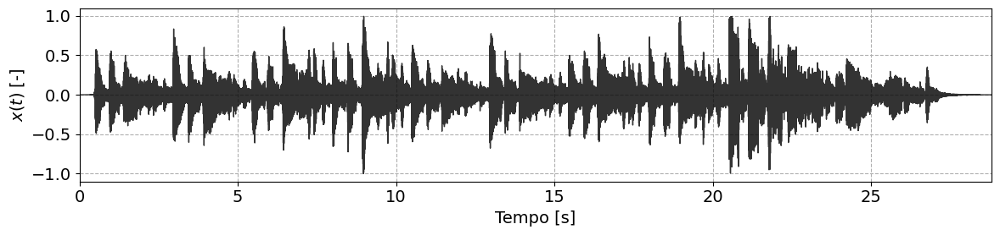

In [5]:
##### x(t) music signal #################
xn, fs = sf.read('miguilim.wav')
xn = xn[:,0] # only one channel
time_xn = np.linspace(0, (len(xn)-1)/fs, len(xn))

plt.figure(figsize=(12,3))
plt.plot(time_xn, xn, '-k', linewidth = 1, alpha = 0.8)
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()
plt.show()

ipd.Audio(xn, rate=fs) # load a NumPy array

In [7]:
fs

48000

# Vamos começar criando um filtro IIR Butterworth e o analisando

In [9]:
# specify your filter as a dictionary
filter_specs = {
    'order' : 4,
    'cutoff_freq' : 1000,
    'type' : 'hp',
    'sampling_freq': fs    
}

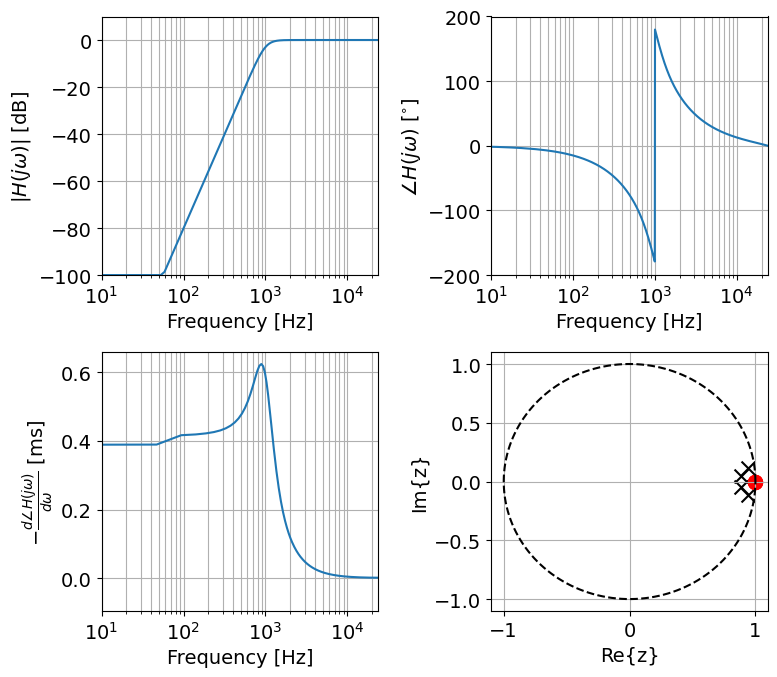

In [11]:
# Architecture for actualy filtering with scipy
sos = signal.butter(N = filter_specs['order'], Wn = filter_specs['cutoff_freq'],
    btype = filter_specs['type'], fs=filter_specs['sampling_freq'], output='sos')
# zeros, poles and gain
z, p, k = signal.sos2zpk(sos)
# a and b
b, a = signal.zpk2tf(z, p, k)

# Transfer function
freq, H = signal.sosfreqz(sos, 4100, fs=fs)
#freq, H = signal.freqz(b, a, 4100, fs=fs)

# Group delay
freqg, gd = signal.group_delay((b, a), 512, fs=fs);

fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(2, 2, 1)
ax.semilogx(freq, 20 * np.log10(np.maximum(abs(H), 1e-5)))
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$|H(j \omega)|$ [dB]')
ax.axis((10, fs/2, -100, 10))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 2)
ax.semilogx(freq, np.rad2deg(np.angle(H)))
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$\angle H(j \omega)$ [$^{\circ}$]')
ax.axis((10, fs/2, -200, 200))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 3)
ax.semilogx(freqg, 1000*gd/fs)
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'$-\frac{d\angle H(j \omega)}{d \omega}$ [ms]')
ax.set_xlim((10, fs/2))
ax.grid(which='both', axis='both')

ax = fig.add_subplot(2, 2, 4)
ax.scatter(np.real(p), np.imag(p), color = 'k', marker = 'x', s = 100)
ax.scatter(np.real(z), np.imag(z), color = 'r', marker = 'o', s = 100)
theta = np.linspace(0, 2*np.pi, 500)
ax.plot(np.cos(theta),np.sin(theta), '--k')
ax.grid(which='both', axis='both')
ax.set_xlabel('Re{z}')
ax.set_ylabel('Im{z}')
plt.tight_layout()
plt.show()

In [15]:
a

array([ 1.        , -3.6580603 ,  5.03143353, -3.0832283 ,  0.7101039 ])

# Vamos filtrar o sinal com o scipy

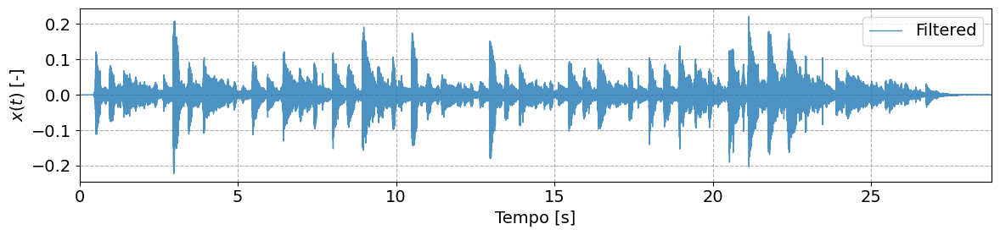

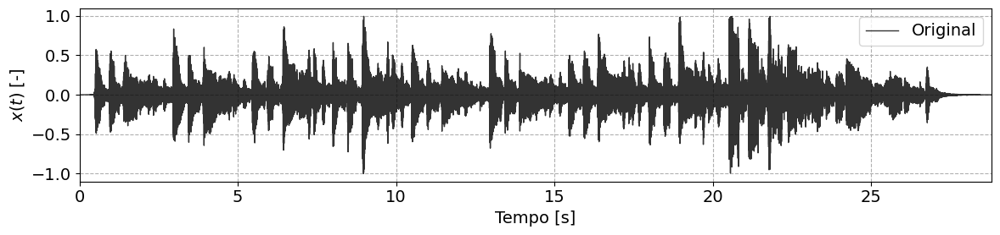

In [19]:
# filter using sos
xn_filtered = signal.sosfilt(sos, xn)

# plot
plt.figure(figsize=(12,3))
plt.plot(time_xn, xn_filtered, linewidth = 1, alpha = 0.8, label = 'Filtered')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()

plt.figure(figsize=(12,3))
plt.plot(time_xn, xn, '-k', linewidth = 1, alpha = 0.8, label = 'Original')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()


ipd.Audio(xn_filtered, rate=fs) # load a NumPy array

In [13]:
a

array([ 1.        , -3.6580603 ,  5.03143353, -3.0832283 ,  0.7101039 ])

# Filtrar com uma função

Aqui podemos usar

\begin{equation}
y[n] = \textbf{b} \ \textbf{x}_{n}^{T} - \textbf{a} \ \textbf{y}_{n}^{T}
\tag{4}
\end{equation}

para enxergar que a filtragem digital é simplesmente uma operação matemática

In [21]:
from tqdm import trange, tqdm

def our_filter(xn, b, a):
    """ Filter using Eq. (4)
    
    Parameters
    -------------
    xn : numpy 1darray
        The input signal
    b : numpy 1darray
        filter numerator coefficients
    a : numpy 1darray
        filter denominator coefficients
    """
    # lenght of xn
    N = len(xn)
    # order
    od = len(b)
    # initialize yn
    yn = np.zeros(N)
    # loop
    bar = tqdm(total = N, desc = 'Filtering...')
    for jn in np.arange(od, N-od):
        x_slice = np.flip(xn[jn-od:jn])
        y_slice = np.flip(yn[jn-od+1:jn])
        #print(x_slice.shape)
        yn[jn] = np.dot(b, x_slice) - np.dot(a[1:],y_slice)
        bar.update(1)
    bar.close()
    gain = np.std(xn)/np.std(yn)
    #yn = (len(xn)/44100)*xn
    return yn
    

Filtering...: 100%|█████████▉| 1382373/1382383 [00:04<00:00, 302080.03it/s]


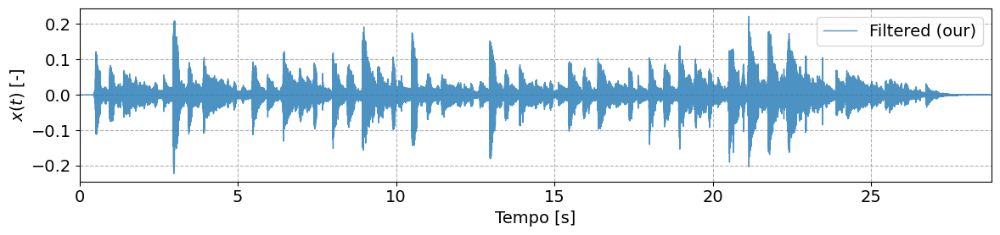

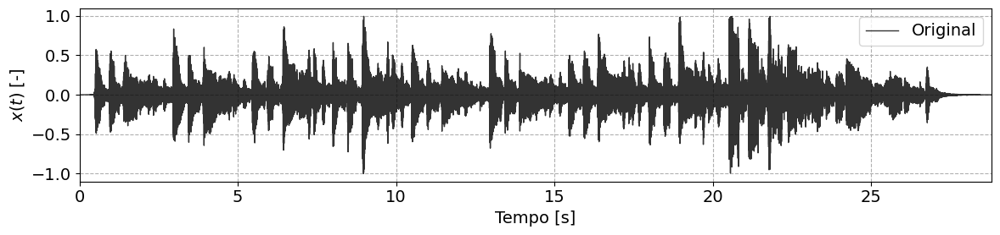

In [23]:
# Filter
yn = our_filter(xn, b, a)

# plot
plt.figure(figsize=(12,3))
plt.plot(time_xn, yn, linewidth = 1, alpha = 0.8, label = 'Filtered (our)')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
#plt.ylim((-40, 40))
plt.tight_layout()

plt.figure(figsize=(12,3))
plt.plot(time_xn, xn, '-k', linewidth = 1, alpha = 0.8, label = 'Original')
plt.legend(loc = 'upper right')
plt.grid(linestyle = '--', which='both')
plt.xlabel('Tempo [s]')
plt.ylabel(r'$x(t)$ [-]')
plt.xlim((0, time_xn[-1]))
plt.tight_layout()

ipd.Audio(yn, rate=fs) # load a NumPy array

In [33]:
np.linalg.norm(yn-xn_filtered)/len(yn)

2.8607916962231552e-06